# 모양 감지

In [1]:
#!hide
from PIL import Image
import cv2
import os
def show(image):
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # BGR → RGB로 채널 순서 변경
    return Image.fromarray(rgb) # 객체 변환: 넘파이 배열 → PIL 형식으로
os.chdir('data')

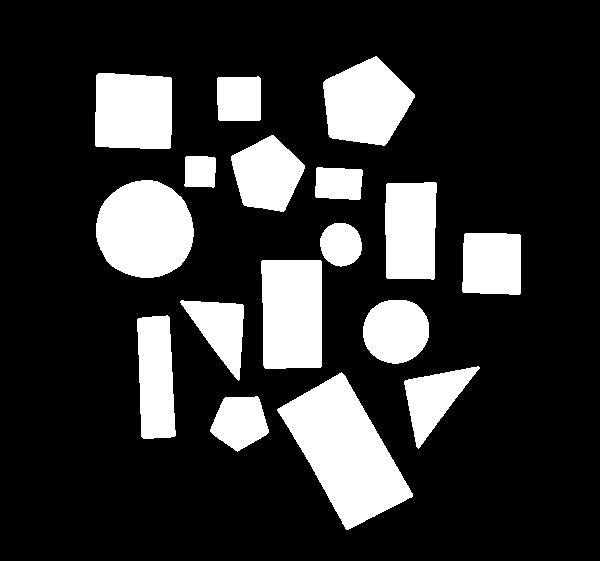

In [ ]:
# 파일 열기
image_path = 'shapes.webp'
image = cv2.imread(image_path)
# 흑백 이미지로 변환
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# 5x5 커널로 가우시안 블러링
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
# 60 이하의 값은 0으로, 그 이상의 값은 255로 이진화(THRESH_BINARY_INV는 흑백 반전)
thresh = cv2.threshold(blurred, 60, 255, cv2.THRESH_BINARY)[1]  
# 노이즈 제거
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
# 보기
Image.fromarray(thresh)



이미지에서 그래서 우리가 이제 여기 shapes.fp 파일을 보면 이렇게 도형들이 있는데 이 도형들에서 지금 동그라미도 있고 세모도 있고 네모도 있고 이런데 예를 들면 여기서 동그라미만 골라내라든가 네모만 골라내라든가 이렇게 특정한 모양만 우리가 이제 찾거나 탐지하거나 이렇게 할 수가 있습니다.

그래서 이제 전처리를 먼저 좀 해줘야 되는데요.

우리가 이제 이때까지 배웠던 것들이 총 동원이 됩니다.

그래서 일단은 우리가 이제 이미지 파일을 읽어오고요.

이미지 파일을 불러오고 그 다음에 우리가 모양을 감지할 거면 이 색깔은 필요 없거든요.

오히려 방해만 되죠.

그래서 일단 흑백으로 변환을 합니다.

그래서 bgr2 gray 이렇게 해가지고 흑백으로 변환을 해놓고요.

그 다음에 우리가 이제 이거 결국 모양이라는 게 경계선의 형태에 따라서 모양이 결정이 되는 거거든요.

그래서 경계선을 탐지를 해야 되는데 이 선이 보면은 이제 반듯반듯하지가 않고 약간 노이즈도 자글자글 있고 약간 그렇기 때문에 약간 이제 블러를 해 줘 가지고 쓸데없는 노이즈를 싹 날려줄 겁니다.

쓸데없는 노이즈를 싹 날려주고 나서 그 다음에 이제 여기 회색 이런 거는 별로 상관 필요가 없잖아요.

어쨌든 직선만 있으면 되니까 경계를 가장 확실하게 하는 방법은 이진화를 시켜 가지고 흰색하고 검은색만 남기면 가장 깔끔하게 딱 떨어지는 형태가 될 겁니다.

그래서 이제 전처리를 우리가 이제 이렇게 해 주도록 하겠습니다.

그러니까 우리가 이제 경계선은 그냥 밝은 데서 어두운 거 사이에 보면 윤곽선을 말 그대로 돼요 도형을 따라서 외부 외곽선을 comfortable 그래서 이제 윤곽선이 추출하는 거는 Find Contour라는 거를 쓰시면 되고요 그래서 여기서 Non-Zero Pixel을 객체로 감전하게 되는데 Non-Zero라는 건 0이면 까만색인데 Non-Zero니까 흰색이라는 얘기죠

그래서 흰색을 물체로 보고 흰색과 까만색의 경계선을 윤곽선으로 추출하게 됩니다

그래서 만약에 여러분들이 가지고 있는 이미지가 흰 바탕에 까만색으로 된 물체다

그럼 어떻게 하면 될까요?

색깔을 반전시켜 주시면 됩니다 검은 바탕에 흰색으로 색깔을 반전시켜 주시면 돼요

In [248]:
contours, hierarchy = cv2.findContours(
    thresh.copy(),  # 이미지, non-zero 픽셀을 객체로 간주
    cv2.RETR_EXTERNAL,  # 윤곽선 검출 모드
    cv2.CHAIN_APPROX_SIMPLE) # 윤곽선 근사화 방법 

그래서 전처리를 해가지고 그렇게 반전을 시켜주시고 그 다음 윤곽선 검출 모드가 있는데 이 검출 모드는 뒷장에 나와 있는데요 익스터널로 돼 있으면 어떤 물체가 있을 때 이 물체의 바깥쪽 윤곽선만 따낸다

이렇게 쓰는 겁니다

외곽선 형태만 그 다음에 이제 뭐 틀이 이렇게 되면 이제 다단계고 이렇게 되는데 이런 거는 이제 좀 복잡해서 잘 쓸 일이 없고 우리가 보통 이제 외곽선 형태로 이제 검출을 하게 됩니다

그 다음에 이제 여기 근사화 방법이 있는데 이거 근사화 방법은 윤곽선을 어떤 식으로 이렇게 연결을 해가지고 결국에는 윤곽선들을 다 연결을 해서 하나의 이제 도형으로 만들어야 되는데 어떻게 할 거냐 여기에 이제 여러가지로 연결하는 방법이 있는데, 어떻게 할 거냐 여기에 이제 여러가지로 연결하는 방법이 있는데, 그 알고리즘들이 있습니다

이거는 뭐 뭐가 더 맞고 이런건 없고 우리가 이제 데이터 어떤 이미지에 따라서 잘 맞는 알고리즘이 다를 수가 있어요

뒤로 갈수록 더 최신 알고리즘이긴 합니다

그래서 요거는 이제 바꿔 가면서 해보시면 되겠는데 일단은 우리가 이제 심플 이라는 알고리즘을 쓸 거에요

그래서 요거는 그 말 그대로 단순한 알고리즘 이라서 꼭지점만 이렇게 따 가지고 윤곽선을 만드는 그런 방법입니다

In [249]:
hierarchy

array([[[ 1, -1, -1, -1],
        [ 2,  0, -1, -1],
        [ 3,  1, -1, -1],
        [ 4,  2, -1, -1],
        [ 5,  3, -1, -1],
        [ 6,  4, -1, -1],
        [ 7,  5, -1, -1],
        [ 8,  6, -1, -1],
        [ 9,  7, -1, -1],
        [10,  8, -1, -1],
        [11,  9, -1, -1],
        [12, 10, -1, -1],
        [13, 11, -1, -1],
        [14, 12, -1, -1],
        [15, 13, -1, -1],
        [16, 14, -1, -1],
        [-1, 15, -1, -1]]], dtype=int32)

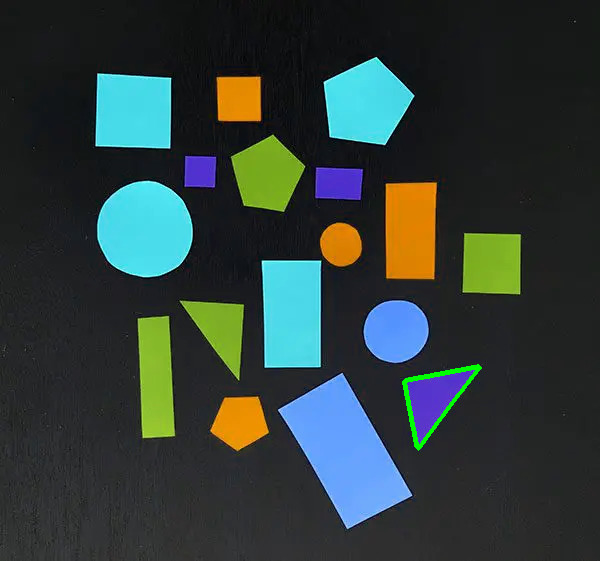

In [279]:
contoured_image = image.copy()  # 이미지 복사
i = 2# 2번 도형
color = 0, 255, 0 # green
thickness = 3  # 두께
Image.fromarray(
	cv2.drawContours(contoured_image, contours, i, color, thickness))

요걸로 윤곽선을 따 낸 다음에 우리가 눈으로 보고 싶은데 어떻게 보면 되냐면 이미지를 복사를 해요

그 다음에 이제 도형이 여러개가 있거든요

여기 보시면 이제 도형이 여러개가 있는데 도형 중에 우리가 예를 들면 2번을 골라서 2번의 테두리를 초록색으로 왜 이게 초록색이냐면 b, g, r 이라서 g가 255고 b랑 r은 0이니까 초록색이 됩니다

초록색으로 두께 3으로 해가지고 드로우 컨투어 이렇게 하면은 그 요 이미지를 이제 보여주게 됩니다


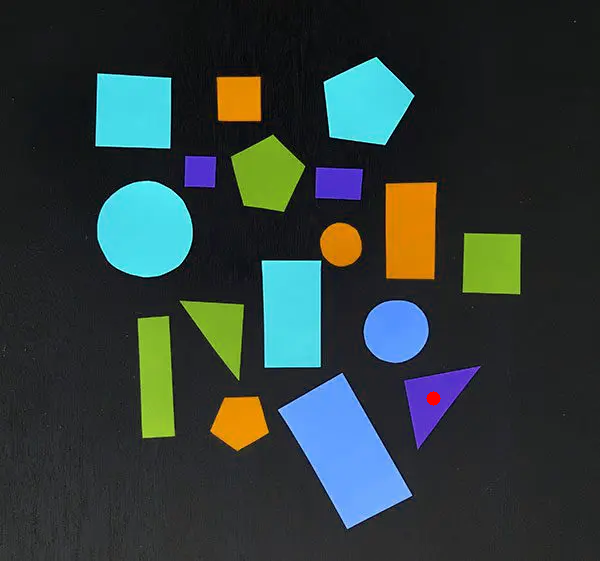

In [280]:
M = cv2.moments(contours[i]) # 모멘트 계산
cX = int(M["m10"] / M["m00"]) # x좌표의 무게 중심
cY = int(M["m01"] / M["m00"]) # y좌표의 무게 중심

dst = image.copy()
center_color = 255, 0, 0 # red
no_stroke = -1  # 테두리 없음
radius = 7  # 반지름
Image.fromarray(cv2.circle(dst, (cX, cY), radius, center_color, no_stroke))


그 다음에 이미지 모먼트라는 게 있는데요 말이 좀 어려운데 이미지의 픽셀 분포에 대한 가중치 평균 뭐 이렇게 되니까 말이 좀 어렵잖아요 사실 별 얘기는 아니고 이미지를 이루는 점들 있잖아요

그 점들의 좌표를 밝기를 곱해가지고 평균을 내는 건데요 지금 우리는 밝기를 전부 1로 통일 255로 통일을 해 놨기 때문에 결국 밝기는 다 똑같습니다

밝기는 그냥 다 똑같으니까 우리가 평균 구할 때 공식안에 이렇게 다 똑같은 값이 들어가면 그냥 밖으로 빠져나가죠

그러니까 이거는 없는 거랑 똑같아요

결국엔 뭐냐면 좌표값의 평균이 됩니다

좌표값의 평균이 되는데 좌표값의 평균을 여러 가지 방식으로 계산할 수 있는데 여기 이제 M00 이거는 면적이 되고

왜냐면 모든 점을 다 더한 거기 때문에 M1이니까 M2가 더한 거니까 M01 나누기 M00 하면은 그 무게중심에 X좌표가 되고 M01 나누기 M00 하면 무게중심에 Y좌표가 됩니다

이건 이제 계산 공식이 있어요

그래서 여기 대입하면은 공식이 나오고 그래서 CX,CY가 그 도형의 무게중심이 됩니다

그래서 우리가 이 모먼트를 이용을 해서 무게중심을 공식으로 구할 수가 있어요

무게중심을 구하면은 우리가 그 무게중심을 점으로 찍을 수가 있겠죠

그래서 우리가 지금 테두리를 둘러싼 게 지금 2번 도형인데 무게중심을 구해 가지고 이렇게 보면 여기에 이제 무게중심이 이렇게 빨간 점으로 이렇게 찍히게 됩니다

그래서 이렇게 공기 딱 가운데 찍어 갖고 공기로 쑥 빨아들여서 진공 상태를 만들어서 이렇게 진공 흡착하는 로봇인데 만약에 우리가 로봇 암으로 이걸 집어 올리는데 팔로 집어 올린다고 하면 이 양쪽 끝을 봐야겠지만 진공 흡착하는 방식이면은 여기 무게중심에다가 로봇 팔을 갖다가 딱 찍어야 가장 안정적으로 물건을 들 수가 있겠죠

물론 이제 모양이 이렇게 균일하게 생겼다는 가정하에서 그래서 위에서 이렇게 딱 보고 무게중심을 찾아 가지고 거기에 딱 찍으면 됩니다

In [281]:
c = contours[i]  # 곡선
peri = cv2.arcLength(c, True)  # 둘레 길이(폐곡선 여부) L 대문자
approx = cv2.approxPolyDP(
    c, # 곡선
    0.02 * peri, # 허용 오차
    True)  # 폐곡선 여부
n = len(approx)  # n각형


우리가 앞 시간에 한 것은 어떤 이미지가 있으면 이미지에서 윤곽선을 뽑아내 가지고 윤곽선을 가지고 무게중심을 잡아내고 했는데 그러면 우리가 이거를 사각형 이라든가 삼각형 이라든가 원 이라든가 이런 식으로 도형으로 구별하려면 한 가지 방법은 다각형으로 근사를 하는 겁니다 윤곽선이 이렇게 있는데 이거를 보고 정확하게 이미지라는 게 항상 그렇지만 우리 눈으로 보면은 반듯해 보여도 실제로는 울퉁불퉁 하거든요

그럼 이거를 이제 사각형으로 반듯하게 이렇게 만들어 주면 제가 손으로 그리니까 또 사진이 안 돼요

사각형으로 만들어 주면은 이게 어떤 도형인지 구별하기가 더 쉬워지겠죠

그래서 이제 이거를 다각형으로 만들어 주는 알고리즘이 있는데 이런 세 사람이 만들어서 이런 이름이 붙어 있는 알고리즘이 있습니다

그래서 어떻게 하냐면 이게 이제 까만색 선이 실제 윤곽선이에요

그래서 까만색 선이 실제 윤곽선인데 이 윤곽선의 시작에서 끝까지를 직선으로 쭉 이으면 하늘색으로 나타낸 범위가 이제 오차범위에요 오차범위인데 그러면은 이 점은 오차범위 바깥쪽에 있죠

그래서 이거는 남겨요

그러면은 이제 이렇게 이렇게 다각형으로 이으면 되겠죠

그러면 지금 이제 이렇게 되는데 그럼 이 점에서 이 점까지를 이었을 때 이 점은 어떻게 되냐면 이 점은 이거에 오차범위 안에 들어갑니다

그렇죠

그래서 오차범위 안에 들어가는 점은 그냥 지워버려요

그래서 이런 계산을 계속 반복해서 하면은 점점 더 자글자글한 점을 만들 수 있죠.

그렇죠?

윤곽선이 다 곧게 펴져가지고 다각형으로 근사를 하게 됩니다

그래서 우리가 윤곽선을 먼저 추출을 한 다음에 그 다음에 오차범위를 정해줘야 되는데 오차범위를 보통 어떻게 정하냐면 둘레의 길이를 재요

그래서 둘레의 길이를 잰 다음에 페리미터를 재가지고 거기에다가 얼마 이런 식으로 곱하는 식으로 많이 합니다

그러니까 둘레의 길이 대비해서 한 2% 정도 오차를 주겠다

이런 거죠

In [282]:
n

3

어쨌든 그래서 N을 해보면 몇 각형인지 나옵니다.

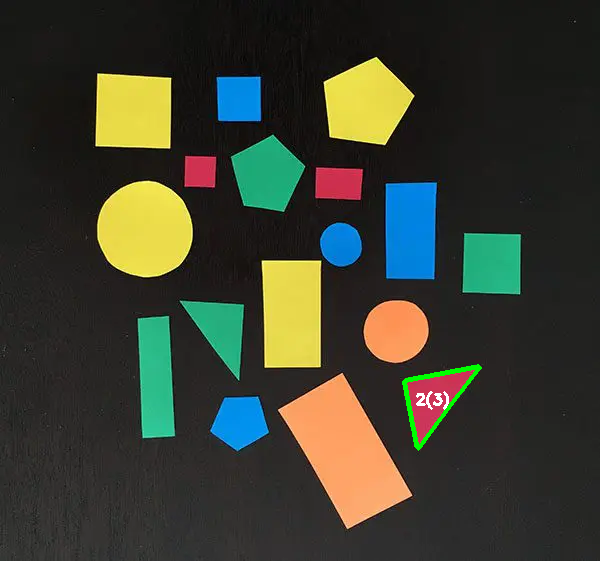

In [284]:
font = cv2.FONT_HERSHEY_SIMPLEX # 글꼴
fontScale = 0.5  # 배율
textThickness = 2  # 획 굵기
fontColor = 255, 255, 255 # white
text = f'{i}({n})'
textsize = cv2.getTextSize(text, font, fontScale, textThickness)[0]
textX = cX - textsize[0] // 2  # 중심 좌표에서 글자 크기만 큼 조정
textY = cY + textsize[1] // 2
show(
	cv2.putText(contoured_image, text, (textX, textY), font, fontScale, 
		     fontColor, textThickness))


그래서 여기 이제 보시면은 여기 put text 이렇게 하면은 요거 이제 글자를 쓰라는 겁니다 글자를 쓰는데 여기 이제 이미지에다가 텍스트는 뭐라고 쓰고 그 다음에 여기 좌표 텍스트의 좌표는 뭐라고 하고 글꼴은 뭐라고 하고 그 다음에 글꼴 크기 글꼴 색깔 글꼴 굵기 이런식으로 할 수 있는데요

요거를 이제 실행을 해보면 여기에 2번 도형이고 괄호하고 3 삼각형이다

이렇게 표시를 한겁니다

그래서 이제 글자가 좀 크면 지금 글자가 좀 크죠

여기 배율에 1이라고 되어 있는데 배율을 반으로 줄여 주시면 글자가 좀 작게 나옵니다

이미지를 다 이렇게 넣어 주시면 됩니다

다시 해야겠군요 컨투어 이미지를 앞부분으로 가서 다시 보시면 이제 글자가 좀 작아졌죠

요거는 이제 폰트 스케일 이걸 이제 배율을 조정하시면 글자 크기를 조정하실 수 있구요 획 굵기는 요거 바꾸시면 되고 글자 색은 요건데 이제 bgr 이니까 그거에 맞춰서 하시면 되구요

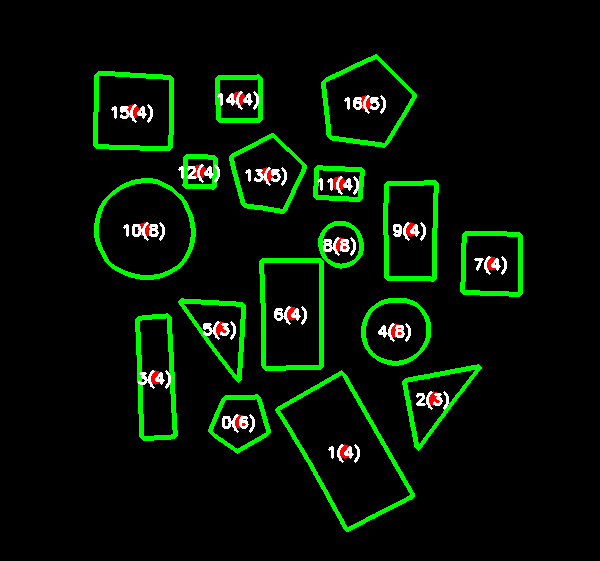

In [294]:
contoured_image = np.zeros_like(image) # 까만 바탕에 그리기
#contoured_image = image.copy() # 원본 위에 겹쳐 그리기
for i in range(len(contours)):
    # 윤곽선 그리기
    cv2.drawContours(contoured_image, contours, i, color, thickness)
    # 다각형 근사
    c = contours[i]  # 곡선
    peri = cv2.arcLength(c, True)  # 둘레 길이(폐곡선 여부) L 대문자
    approx = cv2.approxPolyDP(
        c, # 곡선
        0.02 * peri, # 허용 오차
        True)  # 폐곡선 여부
    n = len(approx)  # n각형
    # 무게 중심
    M = cv2.moments(contours[i]) # 모멘트 계산
    cX = int(M["m10"] / M["m00"]) # x좌표의 무게 중심
    cY = int(M["m01"] / M["m00"]) # y좌표의 무게 중심
    cv2.circle(contoured_image, (cX, cY), radius, center_color, no_stroke)
    # 도형 번호 표시
    text = f'{i}({n})'
    textsize = cv2.getTextSize(text, font, fontScale, textThickness)[0]
    textX = cX - textsize[0] // 2  # 중심 좌표에서 글자 크기만 큼 조정
    textY = cY + textsize[1] // 2
    cv2.putText(contoured_image, text, (textX, textY), font, fontScale, 
    		     fontColor, textThickness)
Image.fromarray(contoured_image)


## 직선 검출 

In [296]:
src = cv2.imread("road.webp")
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
#윤곽선 추출
canny = cv2.Canny(gray, 5000, 1500, apertureSize = 5, L2gradient = True)

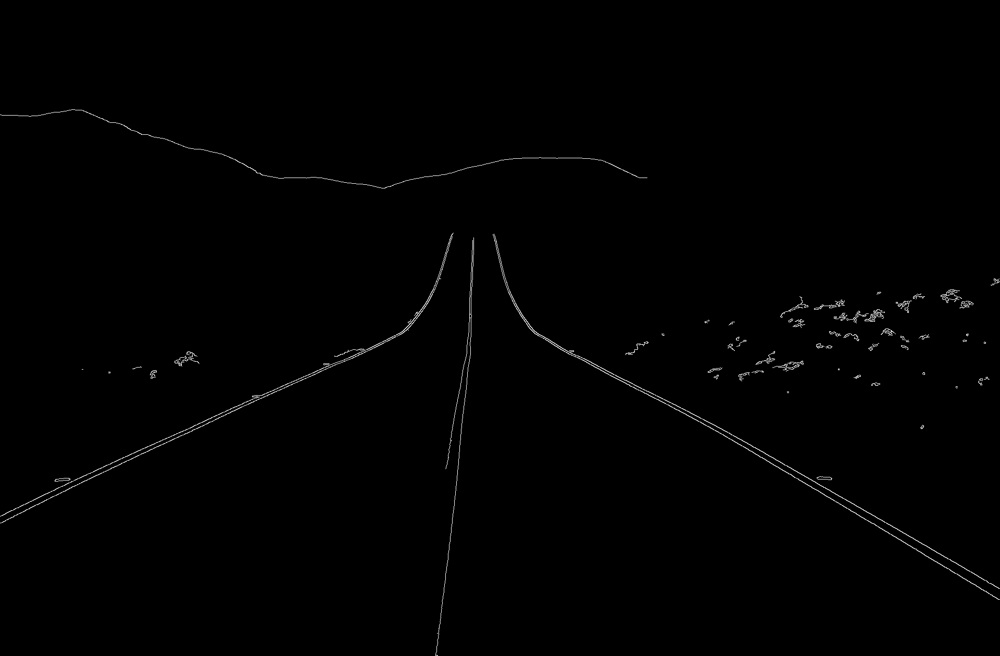

In [297]:
Image.fromarray(canny)

In [298]:
lines = cv2.HoughLines(
    canny, 
    0.8, # 거리 측정 해상도, 0~1 
    np.pi / 180, # 각도의 해상도(라디안)
    150, # 임계값(키울 수록 정확도 증가하고 검출되는 직선의 수는 감소)
    srn = 100, # 거리의 약수(≥0), 허프 변환을 좀 더 정확하게 하기 위한 값
    stn = 200, # 각도의 약수(≥0), 허프 변환을 좀 더 정확하게 하기 위한 값
    min_theta = 0, # 최소 각도
    max_theta = np.pi) # 최대 각도


우리가 또 많이 쓰는 것 중에 하나가 직선 검출이 있습니다.

예를 들면 자동차가 길 따라서 가려면 길을 도로 무슨 선이죠?

중앙선을 잘 탐지해야겠죠.

그래야 이거를 따라서 가겠죠.

예를 들면 자동차 앞에 카메라가 달려있으면 여기서 5만 대만 쓸 데 없는 거는 다 버리고 직선만 검출하면 됩니다.

그래서 일단 윤곽선을 보면 이런 윤곽선이 나오는데 이 윤곽선 중에서 사실 이런 거는 직선이라고 할 수 없고 이런 데가 직선이거든요.

그래서 직선을 어떻게 검출하느냐 하면 허프 변환이라는 직선 같은 도형 검출 알고리즘이 있어요.

그래서 어떤 직선을 찾는 건데 여기서 보시면 직선을 특정 각도로 범위 내에서만 찾을 수 있습니다.

예를 들어 우리가 자동차다.

그럼 자동차 카메라에서 우리가 잡히는 도로의 중앙선 같은 거나 아니면 경계선은 약간 수직 방향으로 있겠죠.

우리가 차가 이쪽으로 가고 있으면 만약에 이런 선이 있다.

그럼 이건 최소한 중앙선은 아니겠죠.

우리가 예를 들면 끼어들기 같은 주유소 같은 데서 나와서 이렇게 갈 때는 여기가 정면에 중앙선이 있겠지만 우리가 일반적으로 주행하고 있는 상황이면 앞에 있는 거는 중앙선은 아니겠죠.

정지선이거나.

이런 거겠죠.

그래서 각도를 지정을 할 수가 있어요.

In [300]:
lines.shape

(15, 1, 2)

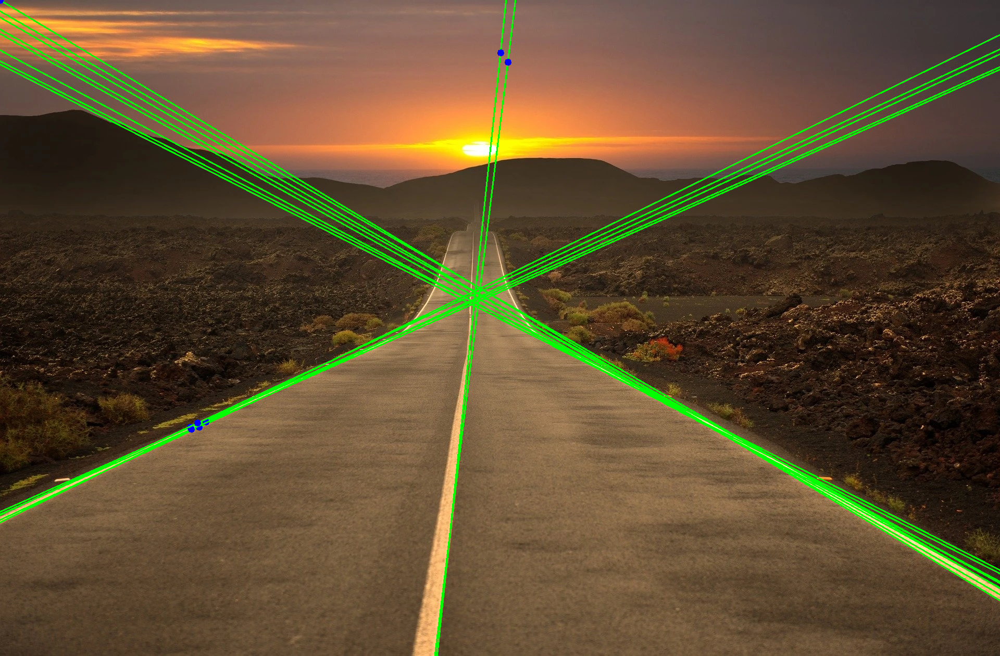

In [302]:
dst = src.copy()
for i in lines:
    rho, theta = i[0][0], i[0][1]
    a, b = np.cos(theta), np.sin(theta)
    x0, y0 = int(a*rho), int(b*rho)
    scale = src.shape[0] + src.shape[1]
    x1 = int(x0 + scale * -b)
    y1 = int(y0 + scale * a)
    x2 = int(x0 - scale * -b)
    y2 = int(y0 - scale * a)
    cv2.line(dst, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.circle(dst, (x0, y0), 3, (255, 0, 0), 5, cv2.FILLED)
show(dst)

In [324]:
# 속도는 빠르지만 정확성은 떨어지는 방식
lines = cv2.HoughLinesP(
    canny, 
    0.8,  # 거리 측정 해상도, 0~1
    np.pi / 180, # 각도의 해상도(라디안)
    90, # 임계값(키울 수록 정확도 증가하고 검출되는 직선의 수는 감소)
    minLineLength = 10,  # 검출할 직선의 최소 길이
    maxLineGap = 100) # 최대 허용 간격(이 간격 내에 있는 직선은 검출 안함)


그다음에 이제 점진성 확률적 허프변환 이런 게 있는데 원래 허프변환에서 조금 약간 수정을 한 거예요.

그래서 조금 정확성은 떨어지지만 좀 더 빠른 방식인데 요거는 이제 직선이 끝 그 무한히 뻗어나가는 형태로 추정을 하는 게 아니라 어떤 점에서 점까지.

요렇게 이제 직선을 추정을 합니다.

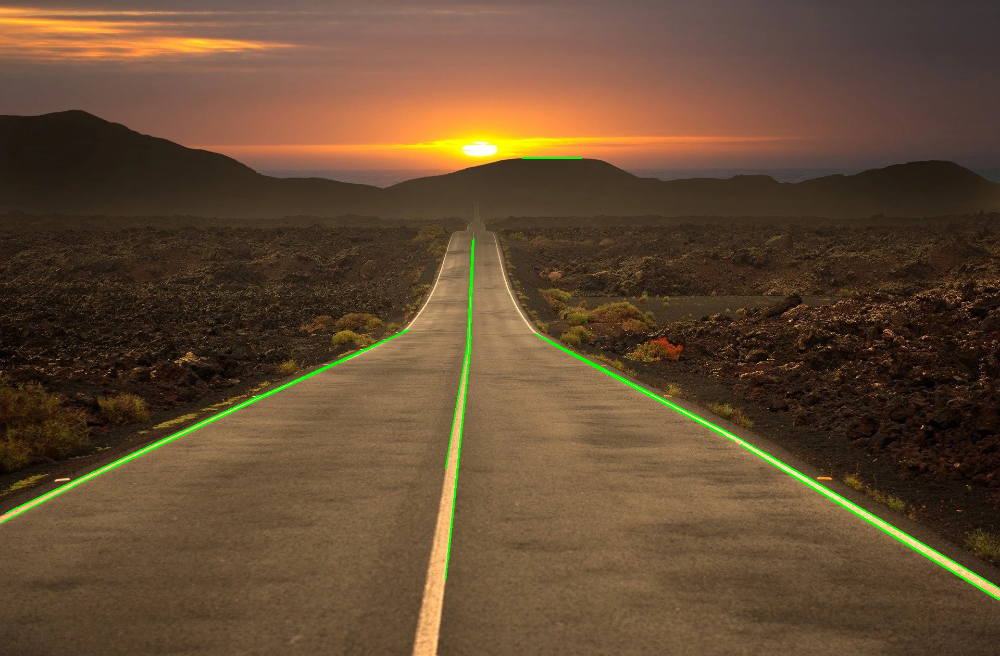

In [325]:
dst = src.copy()
lines = lines.astype(int, copy=False)
for i in lines:
    cv2.line(
        dst, 
        (i[0][0], i[0][1]),  # 시작
        (i[0][2], i[0][3]),  # 끝
        (0, 255, 0),  # 색깔
        2)  # 굵기
show(dst)

## 원 검출

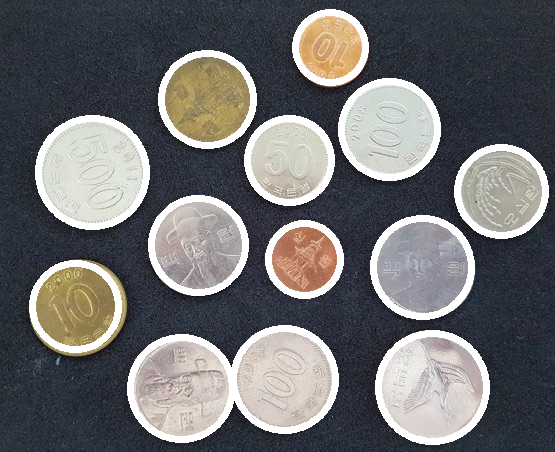

In [332]:
src = cv2.imread("coins_spread1.jpg") # 예제 이미지
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

circles = cv2.HoughCircles(# 허프 변환
    gray, 
    cv2.HOUGH_GRADIENT, # 검출 방법, HOUGH_GRADIENT_ALT도 있음
    1, # 해상도 비율
    100, # 원의 중심 간 최소 거리
    param1 = 250, # 검출 방법의 매개 변수
    param2 = 10, # 검출 방법의 매개 변수
    minRadius = 10, # 최소 반지름
    maxRadius = 70) # 최대 반지름

dst = src.copy()
circles = circles.astype(int)
for i in circles[0]:
    cv2.circle(dst, (i[0], i[1]), i[2], (255, 255, 255), 5)
show(dst)

## 볼록 껍질 & 외접원

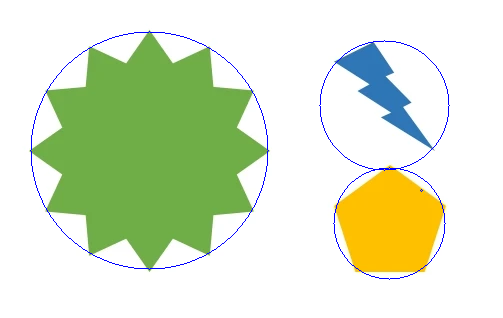

In [ ]:
src = cv2.imread("convex.webp") # 예제 데이터
dst = src.copy()
gray = cv2.cvtColor(src, cv2.COLOR_RGB2GRAY)
ret, binary = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV) # 이진화
contours, hierarchy = cv2.findContours(# 윤곽선
    binary, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)
for i in contours:
    hull = cv2.convexHull(i, clockwise=True) # 볼록 껍질 찾기(True: 시계 방향)
    cv2.drawContours(dst, [hull], 0, (0, 0, 255), 2)
    (x,y),radius =cv2.minEnclosingCircle(i) # 외접원 찾기
    cv2.circle(dst, (int(x), int(y)), int(radius), center_color, 1)
show(dst)